In [557]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

from copy import deepcopy

# Image Enhancement

## Segmentation utilizing the color information (Lab color model)

### Image `HMRegistred.png`

In [634]:
img = cv2.imread('data/HMRegistred.png').astype(np.float32)
target = cv2.imread('data/HMRegistred_target.png').astype(np.float32)

rescale from 0.0 - 255.0 to 0.0 - 1.0

In [615]:
print(np.min(img), np.max(img))
img = img/255.0
print(np.min(img), np.max(img))

0.0 255.0
0.0 1.0


In [616]:
print(np.min(target), np.max(target))
target = target/255.0
print(np.min(target), np.max(target))

7.0 191.0
0.02745098 0.7490196


visualisation of the source and target images

(-0.5, 24.5, 24.5, -0.5)

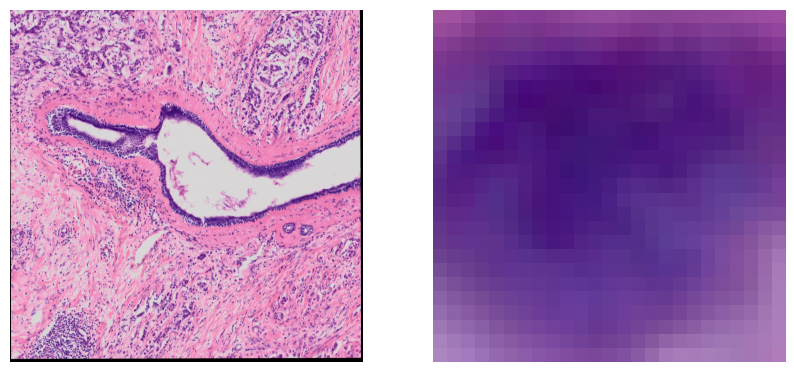

In [617]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axs[0].axis('off')
axs[1].imshow(cv2.cvtColor(target, cv2.COLOR_BGR2RGB))
axs[1].axis('off')

Lab conversion

In [618]:
imgLab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
print('Source:')
print(np.min(imgLab[:,:,0]), np.max(imgLab[:,:,0]))
print(np.min(imgLab[:,:,1]), np.max(imgLab[:,:,1]))
print(np.min(imgLab[:,:,2]), np.max(imgLab[:,:,2]))

targetLab = cv2.cvtColor(target, cv2.COLOR_BGR2Lab)
print('\nTarget:')
print(np.min(targetLab[:,:,0]), np.max(targetLab[:,:,0]))
print(np.min(targetLab[:,:,1]), np.max(targetLab[:,:,1]))
print(np.min(targetLab[:,:,2]), np.max(targetLab[:,:,2]))

Source:
0.0 88.16528
-2.75 58.15625
-55.0625 5.15625

Target:
17.51709 61.505127
24.375 46.90625
-50.734375 -23.734375


#### Computing deltaE for the source and target - using all 3 channels

computing mean colour for the target image

In [619]:
targetLab_mean = targetLab.mean(axis=(0, 1))
targetLab_mean

array([ 32.72286 ,  39.1102  , -40.561676], dtype=float32)

In [620]:
delta_e = np.sqrt(np.sum(np.square(imgLab - targetLab_mean), axis=2))
print(delta_e.shape)
print(np.min(delta_e), np.max(delta_e))

(6000, 6000)
0.2828039 80.737114


(-0.5, 5999.5, 5999.5, -0.5)

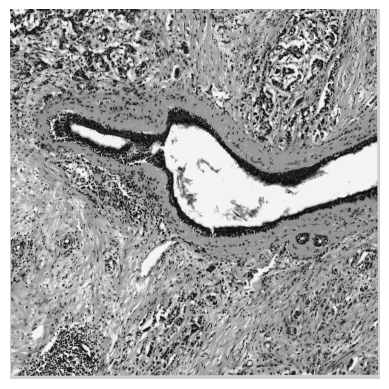

In [621]:
plt.imshow(delta_e, cmap='gray')
plt.axis(False)

thresholding to obtain a binary image containing the nuclei

In [622]:
_, mask = cv2.threshold(delta_e.astype(np.uint8), 0, 1, cv2.THRESH_OTSU)
print(mask.shape)
print(np.unique(mask))

(6000, 6000)
[0 1]


(-0.5, 5999.5, 5999.5, -0.5)

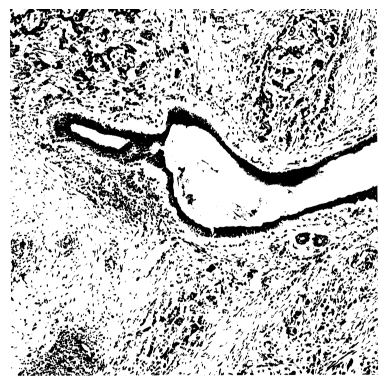

In [623]:
plt.imshow(mask, cmap='gray')
plt.axis(False)

applying the mask on the original image

In [624]:
result = cv2.bitwise_and(img, img, mask=mask)
result.shape

(6000, 6000, 3)

(-0.5, 5999.5, 5999.5, -0.5)

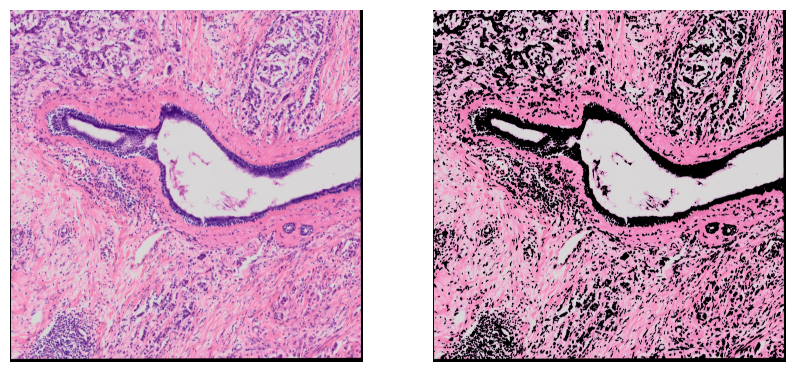

In [625]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axs[0].axis('off')
axs[1].imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
axs[1].axis('off')

#### deltaE for the source and target - using only the a and b channels

In [626]:
delta_e = np.sqrt(np.sum(np.square(imgLab[:, :, :2] - targetLab_mean[:2]), axis=2))
print(delta_e.shape)
print(np.min(delta_e), np.max(delta_e))

(6000, 6000)
0.004272558 68.05678


(-0.5, 5999.5, 5999.5, -0.5)

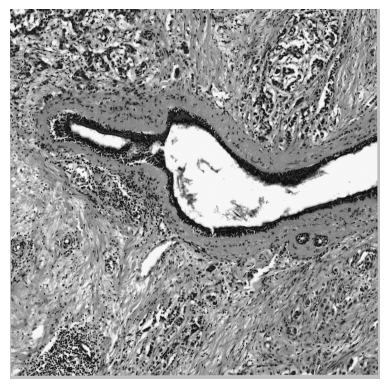

In [627]:
plt.imshow(delta_e, cmap='gray')
plt.axis(False)

thresholding to obtain a binary image containing the nuclei

In [628]:
_, mask = cv2.threshold(delta_e.astype(np.uint8), 0, 1, cv2.THRESH_OTSU)
print(mask.shape)
print(np.unique(mask))

(6000, 6000)
[0 1]


(-0.5, 5999.5, 5999.5, -0.5)

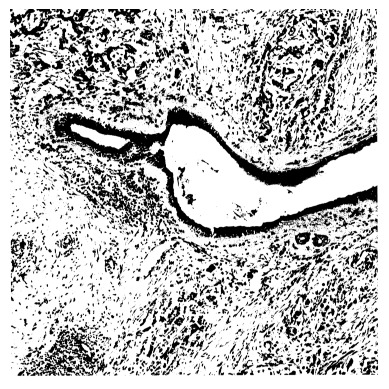

In [629]:
plt.imshow(mask, cmap='gray')
plt.axis(False)

applying the mask on the original image

In [630]:
result = cv2.bitwise_and(img, img, mask=mask)
result.shape

(6000, 6000, 3)

(-0.5, 5999.5, 5999.5, -0.5)

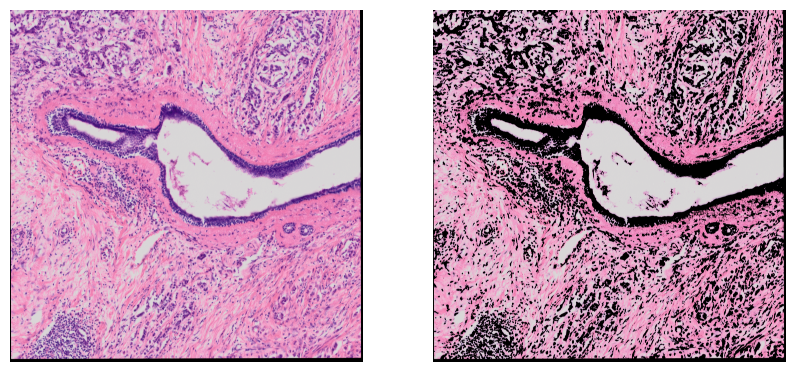

In [631]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axs[0].axis('off')
axs[1].imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
axs[1].axis('off')

### Image `P63Registred.png`

In [576]:
img = cv2.imread('data/P63Registred.png').astype(np.float32)
target = cv2.imread('data/P63Registred_target.png').astype(np.float32)

rescaling

In [577]:
img = img/255.0
target = target/255.0

visualisation of the source and target images

(-0.5, 25.5, 25.5, -0.5)

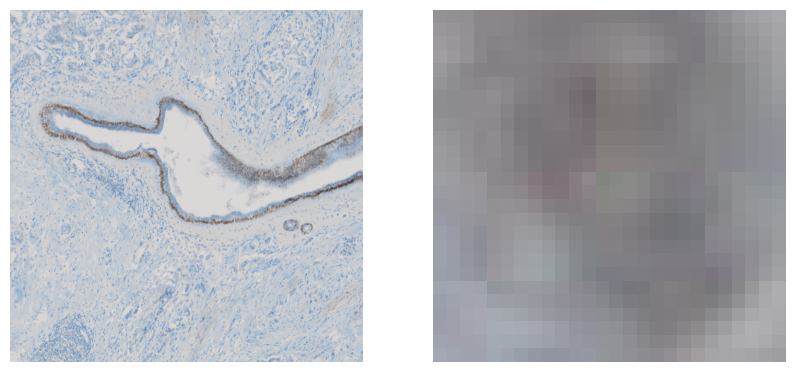

In [578]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axs[0].axis('off')
axs[1].imshow(cv2.cvtColor(target, cv2.COLOR_BGR2RGB))
axs[1].axis('off')

Lab conversion

In [579]:
imgLab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
print('Source:')
print(np.min(imgLab[:,:,0]), np.max(imgLab[:,:,0]))
print(np.min(imgLab[:,:,1]), np.max(imgLab[:,:,1]))
print(np.min(imgLab[:,:,2]), np.max(imgLab[:,:,2]))

targetLab = cv2.cvtColor(target, cv2.COLOR_BGR2Lab)
print('\nTarget:')
print(np.min(targetLab[:,:,0]), np.max(targetLab[:,:,0]))
print(np.min(targetLab[:,:,1]), np.max(targetLab[:,:,1]))
print(np.min(targetLab[:,:,2]), np.max(targetLab[:,:,2]))

Source:
19.085693 89.0686
-12.578125 18.984375
-38.046875 22.203125

Target:
43.99414 71.45386
-2.453125 6.390625
-6.984375 3.375


computing mean colour for the target image

In [580]:
targetLab_mean = targetLab.mean(axis=(0, 1))
targetLab_mean

array([57.513714 ,  1.4644971, -2.2476885], dtype=float32)

#### Computing deltaE for the source and target - using all 3 channels

In [581]:
delta_e = np.sqrt(np.sum(np.square(imgLab - targetLab_mean), axis=2))
print(delta_e.shape)
print(np.min(delta_e), np.max(delta_e))

(6000, 6000)
0.32899243 38.94498


(-0.5, 5999.5, 5999.5, -0.5)

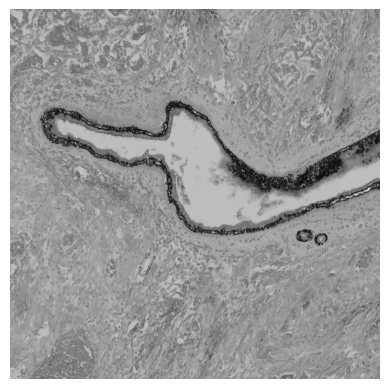

In [582]:
plt.imshow(delta_e, cmap='gray')
plt.axis(False)

thresholding to obtain a binary image containing the nuclei

In [583]:
_, mask = cv2.threshold(delta_e.astype(np.uint8), 0, 1, cv2.THRESH_OTSU)
print(mask.shape)
print(np.unique(mask))

(6000, 6000)
[0 1]


(-0.5, 5999.5, 5999.5, -0.5)

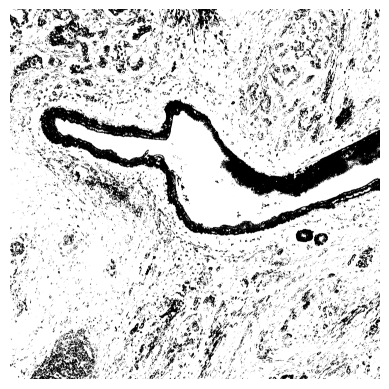

In [584]:
plt.imshow(mask, cmap='gray')
plt.axis(False)

applying the mask on the original image

In [585]:
result = cv2.bitwise_and(img, img, mask=mask)
result.shape

(6000, 6000, 3)

(-0.5, 5999.5, 5999.5, -0.5)

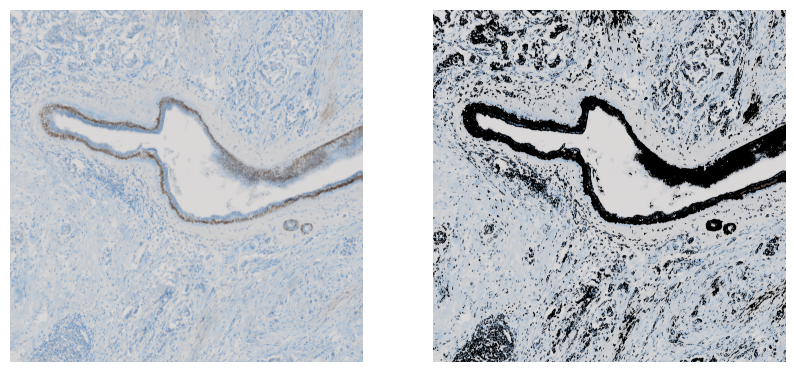

In [586]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axs[0].axis('off')
axs[1].imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
axs[1].axis('off')

#### deltaE for the source and target - using only the a and b channels

In [587]:
delta_e = np.sqrt(np.sum(np.square(imgLab[:, :, :2] - targetLab_mean[:2]), axis=2))
print(delta_e.shape)
print(np.min(delta_e), np.max(delta_e))

(6000, 6000)
0.007675576 38.561638


(-0.5, 5999.5, 5999.5, -0.5)

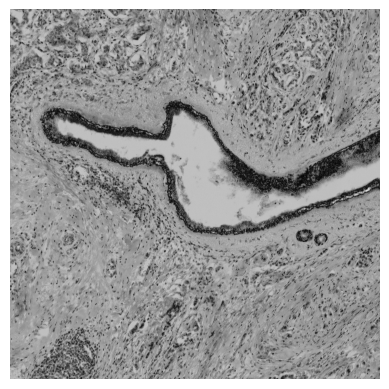

In [588]:
plt.imshow(delta_e, cmap='gray')
plt.axis(False)

thresholding to obtain a binary image containing the nuclei

In [589]:
_, mask = cv2.threshold(delta_e.astype(np.uint8), 0, 1, cv2.THRESH_OTSU)
print(mask.shape)
print(np.unique(mask))

(6000, 6000)
[0 1]


(-0.5, 5999.5, 5999.5, -0.5)

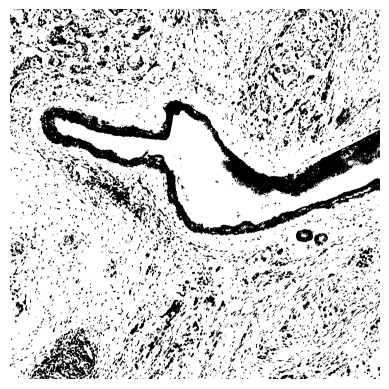

In [590]:
plt.imshow(mask, cmap='gray')
plt.axis(False)

applying the mask on the original image

In [591]:
result = cv2.bitwise_and(img, img, mask=mask)
result.shape

(6000, 6000, 3)

(-0.5, 5999.5, 5999.5, -0.5)

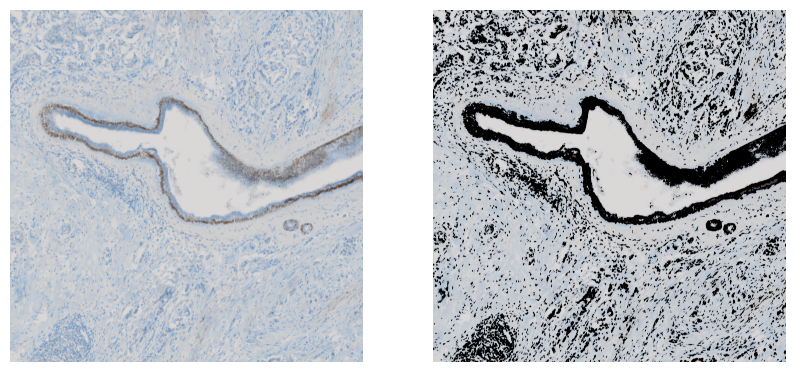

In [592]:
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axs[0].axis('off')
axs[1].imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
axs[1].axis('off')

## Use your knowledge of local descriptors to detect and localize image patch within the larger image from following data

In [679]:
# Load and convert them to gray scale
img = cv2.imread('data/local_descriptors_task/lookup.tif', 0)
patch1 = cv2.imread('data/local_descriptors_task/patch1.tif', 0)
patch2 = cv2.imread('data/local_descriptors_task/patch2.tif', 0)
patch3 = cv2.imread('data/local_descriptors_task/patch3.tif', 0)

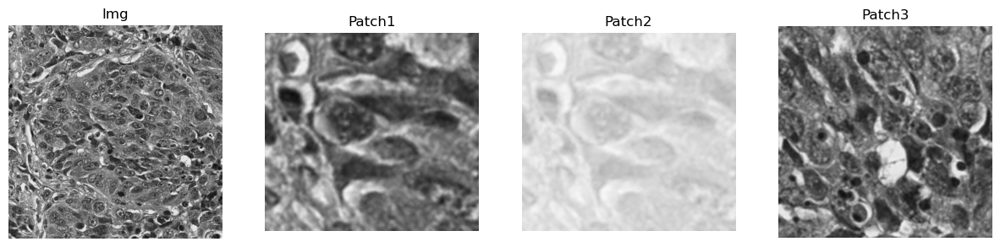

In [680]:
fig, axs = plt.subplots(1, 4, figsize=(15, 10))
for i, (p, t) in enumerate(zip((img, patch1, patch2, patch3), ('Img', 'Patch1', 'Patch2', 'Patch3'))):
    axs[i].imshow(cv2.cvtColor(p, cv2.COLOR_BGR2RGB)) 
    axs[i].axis('off')
    axs[i].set_title(t)

Initialization

In [681]:
sift = cv2.SIFT_create()
fast = cv2.FastFeatureDetector_create()
# surf = cv2.SURF_create() # https://stackoverflow.com/questions/69993071/attributeerror-module-cv2-cv2-has-no-attribute-surf-create-2-module-cv2
orb = cv2.ORB_create()

bf = cv2.BFMatcher() # Brute-Force Matcher used for matching descriptors 

### SIFT feature detector

find keypoints

In [682]:
img_kp = sift.detect(img, None)
patch1_kp = sift.detect(patch1, None)
patch2_kp = sift.detect(patch2, None)
patch3_kp = sift.detect(patch3, None)

visualise keypoints

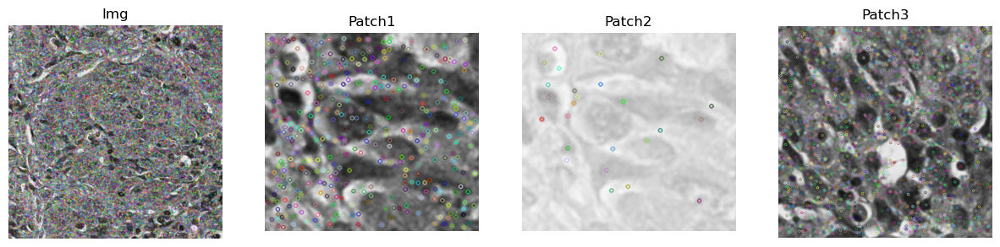

In [683]:
img_with_keypoints = cv2.drawKeypoints(img, img_kp, None)
patch1_with_keypoints = cv2.drawKeypoints(patch1, patch1_kp, None)
patch2_with_keypoints = cv2.drawKeypoints(patch2, patch2_kp, None)
patch3_with_keypoints = cv2.drawKeypoints(patch3, patch3_kp, None)

fig, axs = plt.subplots(1, 4, figsize=(15, 10))
for i, (p, t) in enumerate(zip((img_with_keypoints, patch1_with_keypoints, patch2_with_keypoints, patch3_with_keypoints), ('Img', 'Patch1', 'Patch2', 'Patch3'))):
    axs[i].imshow(p)
    axs[i].axis('off')
    axs[i].set_title(t)

#### SIFT feature descriptor

compute feature descriptors

In [684]:
img_descriptor = sift.compute(img, img_kp)[1]
patch1_descriptor = sift.compute(patch1, patch1_kp)[1]
patch2_descriptor = sift.compute(patch2, patch2_kp)[1]
patch3_descriptor = sift.compute(patch3, patch3_kp)[1]

Compute and draw matches between the original image and patch

In [685]:
# based on https://docs.opencv.org/4.x/dc/dc3/tutorial_py_matcher.html
def compute_matches(img_desc, patch_desc):
    matches = bf.match(patch_desc, img_desc)
    matches = sorted(matches, key=lambda x:x.distance)

    return matches

In [686]:
matches1 = compute_matches(img_descriptor, patch1_descriptor)
matches2 = compute_matches(img_descriptor, patch2_descriptor)
matches3 = compute_matches(img_descriptor, patch3_descriptor)

compute homography and localize image patch

In [687]:
# based on https://docs.opencv.org/3.4/d1/de0/tutorial_py_feature_homography.html
def compute_homography(img, img_kp, patch, patch_kp, matches):
    patch_pts = np.float32([patch_kp[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    img_pts = np.float32([img_kp[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

    H, _ = cv2.findHomography(patch_pts, img_pts, cv2.RANSAC)

    patch_w = patch.shape[1]
    patch_h = patch.shape[0]
    patch_corners = np.float32([[0, 0], [0, patch_h], [patch_w, patch_h], [patch_w, 0]]).reshape(-1, 1, 2)
    patch_corners_transformed = cv2.perspectiveTransform(patch_corners, H)
    new_img = cv2.polylines(img, [np.int32(patch_corners_transformed)], True, (0, 0, 255), 3, cv2.LINE_AA)

    return new_img 

Text(0.5, 1.0, 'Patch1 - SIFT-SIFT')

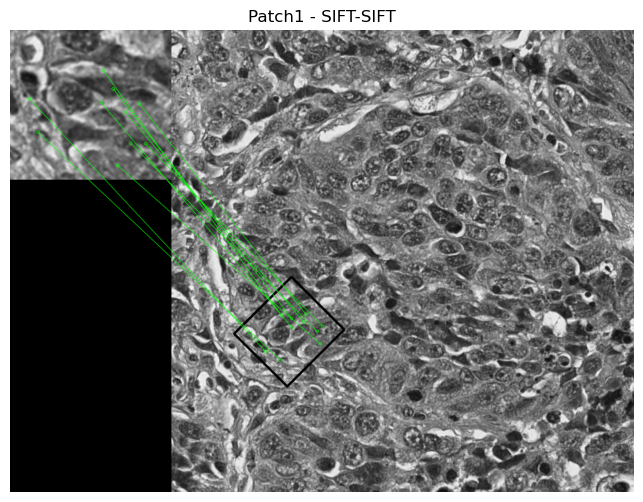

In [688]:
new_img1 = compute_homography(deepcopy(img), img_kp, patch1, patch1_kp, matches1)
result1 = cv2.drawMatches(patch1, patch1_kp, new_img1, img_kp, matches1[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=(0, 255, 0))

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.imshow(result1)
ax.axis('off')
ax.set_title('Patch1 - SIFT-SIFT')

Text(0.5, 1.0, 'Patch2 - SIFT-SIFT')

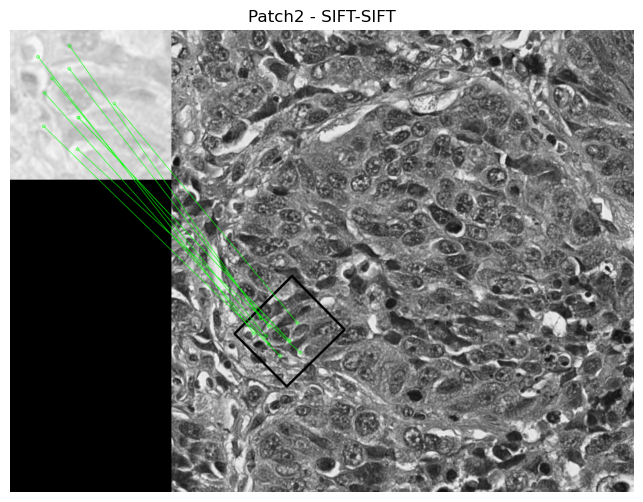

In [689]:
new_img2 = compute_homography(deepcopy(img), img_kp, patch2, patch2_kp, matches2)
result2 = cv2.drawMatches(patch2, patch2_kp, new_img2, img_kp, matches2[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=(0, 255, 0))

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.imshow(result2)
ax.axis('off')
ax.set_title('Patch2 - SIFT-SIFT')

Text(0.5, 1.0, 'Patch3 - SIFT-SIFT')

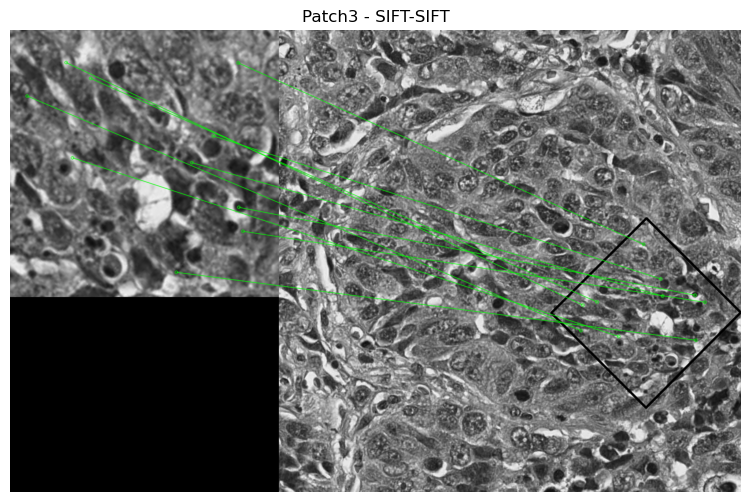

In [690]:
new_img3 = compute_homography(deepcopy(img), img_kp, patch3, patch3_kp, matches3)
result3 = cv2.drawMatches(patch3, patch3_kp, new_img3, img_kp, matches3[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=(0, 255, 0))

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.imshow(result3)
ax.axis('off')
ax.set_title('Patch3 - SIFT-SIFT')

#### ORB feature descriptor

compute feature desctiptors

In [691]:
img_descriptor = orb.compute(img, img_kp)[1]
patch1_descriptor = orb.compute(patch1, patch1_kp)[1]
patch2_descriptor = orb.compute(patch2, patch2_kp)[1]
patch3_descriptor = orb.compute(patch3, patch3_kp)[1]

error: OpenCV(4.7.0) /Users/opencv-cn/GHA-OCV-1/_work/opencv-python/opencv-python/opencv/modules/imgproc/src/resize.cpp:4065: error: (-215:Assertion failed) inv_scale_x > 0 in function 'resize'


In [692]:
# !!!!! NOT CREATED BY ME, BUT IT DID FIX THE ISSUE !!!!! # 

# Convert keypoints detected by SIFT to numpy array of coordinates
img_pts = cv2.KeyPoint_convert(img_kp)
patch1_pts = cv2.KeyPoint_convert(patch1_kp)
patch2_pts = cv2.KeyPoint_convert(patch2_kp)
patch3_pts = cv2.KeyPoint_convert(patch3_kp)

# Create new keypoints using the converted coordinates for computing descriptors with ORB
img_kp2 = [cv2.KeyPoint(x, y, size=100) for x, y in img_pts]
patch1_kp2 = [cv2.KeyPoint(x, y, size=100) for x, y in patch1_pts]
patch2_kp2 = [cv2.KeyPoint(x, y, size=100) for x, y in patch2_pts]
patch3_kp2 = [cv2.KeyPoint(x, y, size=100) for x, y in patch3_pts]

# Compute descriptors using ORB
img_descriptor = orb.compute(img, img_kp2)[1]
patch1_descriptor = orb.compute(patch1, patch1_kp2)[1]
patch2_descriptor = orb.compute(patch2, patch2_kp2)[1]
patch3_descriptor = orb.compute(patch3, patch3_kp2)[1]

compute and draw matches between the original image and patch

In [693]:
matches1 = compute_matches(img_descriptor, patch1_descriptor)
matches2 = compute_matches(img_descriptor, patch2_descriptor)
matches3 = compute_matches(img_descriptor, patch3_descriptor)

Text(0.5, 1.0, 'Patch1 - SIFT-ORB')

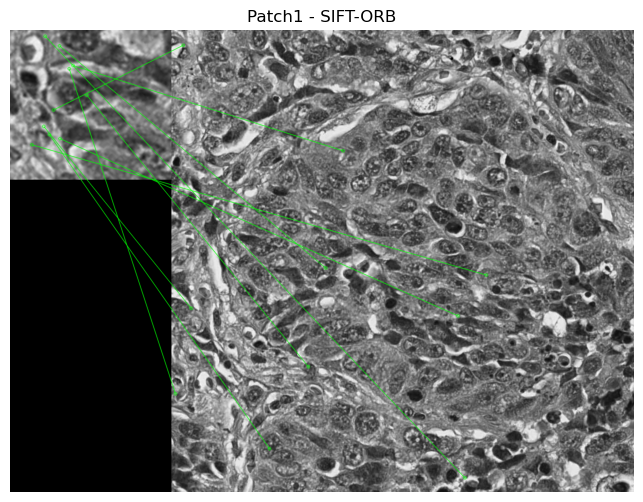

In [694]:
new_img1 = compute_homography(deepcopy(img), img_kp, patch1, patch1_kp, matches1)
result1 = cv2.drawMatches(patch1, patch1_kp, new_img1, img_kp, matches1[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=(0, 255, 0))

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.imshow(result1)
ax.axis('off')
ax.set_title('Patch1 - SIFT-ORB')

Text(0.5, 1.0, 'Patch2 - SIFT-ORB')

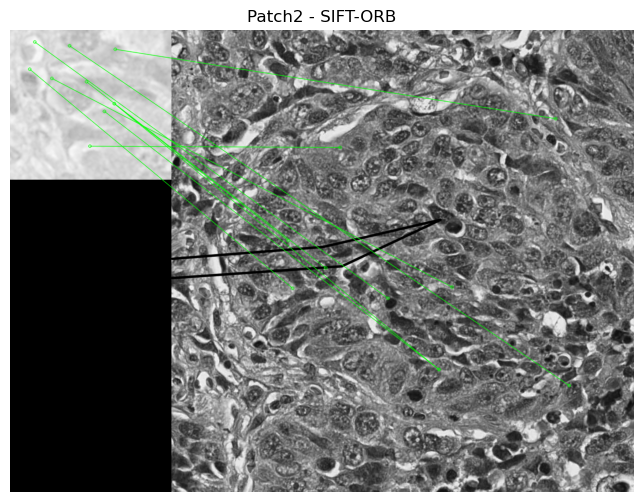

In [695]:
new_img2 = compute_homography(deepcopy(img), img_kp, patch2, patch2_kp, matches2)
result2 = cv2.drawMatches(patch2, patch2_kp, new_img2, img_kp, matches2[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=(0, 255, 0))

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.imshow(result2)
ax.axis('off')
ax.set_title('Patch2 - SIFT-ORB')

Text(0.5, 1.0, 'Patch3 - SIFT-ORB')

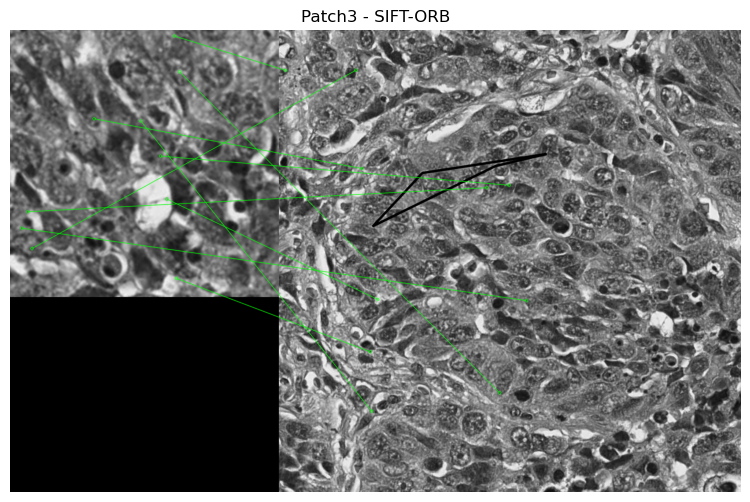

In [696]:
new_img3 = compute_homography(deepcopy(img), img_kp, patch3, patch3_kp, matches3)
result3 = cv2.drawMatches(patch3, patch3_kp, new_img3, img_kp, matches3[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=(0, 255, 0))

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.imshow(result3)
ax.axis('off')
ax.set_title('Patch3 - SIFT-ORB')

### FAST feature detector

find keypoints using the fast detector

In [697]:
img_kp = fast.detect(img, None)
patch1_kp = fast.detect(patch1, None)
patch2_kp = fast.detect(patch2, None)
patch3_kp = fast.detect(patch3, None)

visualise keypoints

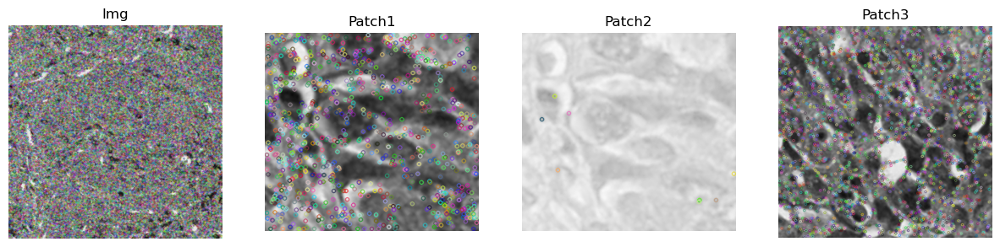

In [698]:
img_with_keypoints = cv2.drawKeypoints(img, img_kp, None)
patch1_with_keypoints = cv2.drawKeypoints(patch1, patch1_kp, None)
patch2_with_keypoints = cv2.drawKeypoints(patch2, patch2_kp, None)
patch3_with_keypoints = cv2.drawKeypoints(patch3, patch3_kp, None)

fig, axs = plt.subplots(1, 4, figsize=(15, 10))
for i, (p, t) in enumerate(zip((img_with_keypoints, patch1_with_keypoints, patch2_with_keypoints, patch3_with_keypoints), ('Img', 'Patch1', 'Patch2', 'Patch3'))):
    axs[i].imshow(p)
    axs[i].axis('off')
    axs[i].set_title(t)

#### SIFT feature descriptor

compute feature descriptors

In [699]:
img_descriptor = sift.compute(img, img_kp)[1]
patch1_descriptor = sift.compute(patch1, patch1_kp)[1]
patch2_descriptor = sift.compute(patch2, patch2_kp)[1]
patch3_descriptor = sift.compute(patch3, patch3_kp)[1]

Compute and draw matches between the original image and patch

In [700]:
matches1 = compute_matches(img_descriptor, patch1_descriptor)
matches2 = compute_matches(img_descriptor, patch2_descriptor)
matches3 = compute_matches(img_descriptor, patch3_descriptor)

Text(0.5, 1.0, 'Patch1 - FAST-SIFT')

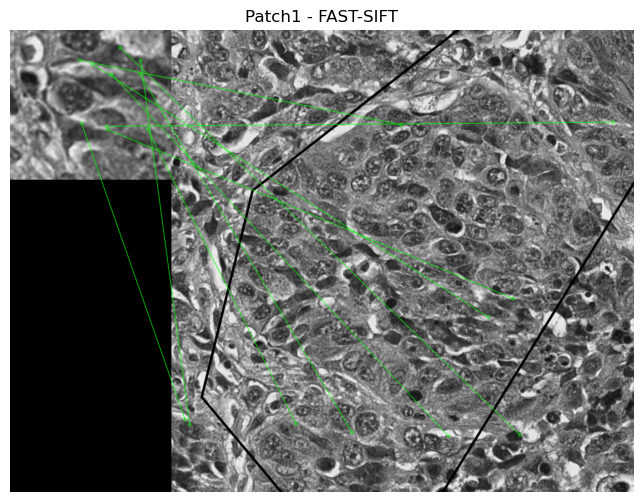

In [701]:
new_img1 = compute_homography(deepcopy(img), img_kp, patch1, patch1_kp, matches1)
result1 = cv2.drawMatches(patch1, patch1_kp, new_img1, img_kp, matches1[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=(0, 255, 0))

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.imshow(result1)
ax.axis('off')
ax.set_title('Patch1 - FAST-SIFT')

Text(0.5, 1.0, 'Patch2 - FAST-SIFT')

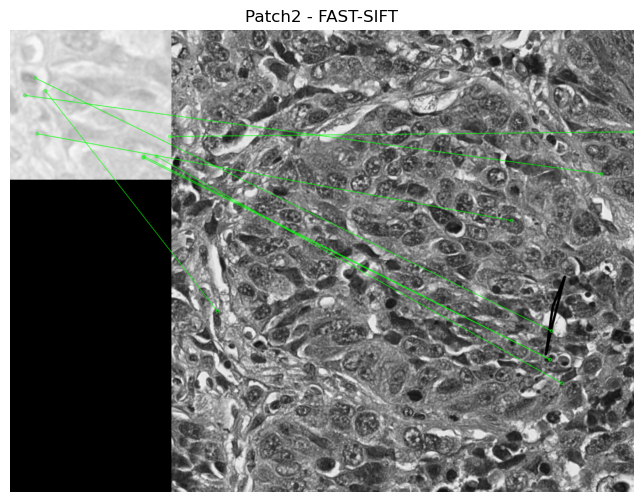

In [702]:
new_img2 = compute_homography(deepcopy(img), img_kp, patch2, patch2_kp, matches2)
result2 = cv2.drawMatches(patch2, patch2_kp, new_img2, img_kp, matches2[:20], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=(0, 255, 0))

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.imshow(result2)
ax.axis('off')
ax.set_title('Patch2 - FAST-SIFT')

Text(0.5, 1.0, 'Patch3 - FAST-SIFT')

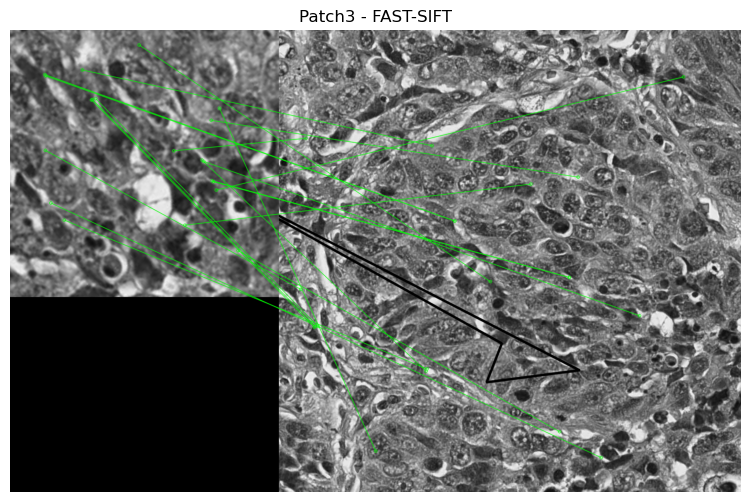

In [703]:
new_img3 = compute_homography(deepcopy(img), img_kp, patch3, patch3_kp, matches3)
result3 = cv2.drawMatches(patch3, patch3_kp, new_img3, img_kp, matches3[:20], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=(0, 255, 0))

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.imshow(result3)
ax.axis('off')
ax.set_title('Patch3 - FAST-SIFT')

#### ORB feature descriptor

compute feature desctiptors

In [ ]:
img_descriptor = orb.compute(img, img_kp)[1]
patch1_descriptor = orb.compute(patch1, patch1_kp)[1]
patch2_descriptor = orb.compute(patch2, patch2_kp)[1]
patch3_descriptor = orb.compute(patch3, patch3_kp)[1]

compute and draw matches between the original image and patch

In [ ]:
matches1 = compute_matches(img_descriptor, patch1_descriptor)
matches2 = compute_matches(img_descriptor, patch2_descriptor)
matches3 = compute_matches(img_descriptor, patch3_descriptor)

Text(0.5, 1.0, 'Patch1 - FAST-ORB')

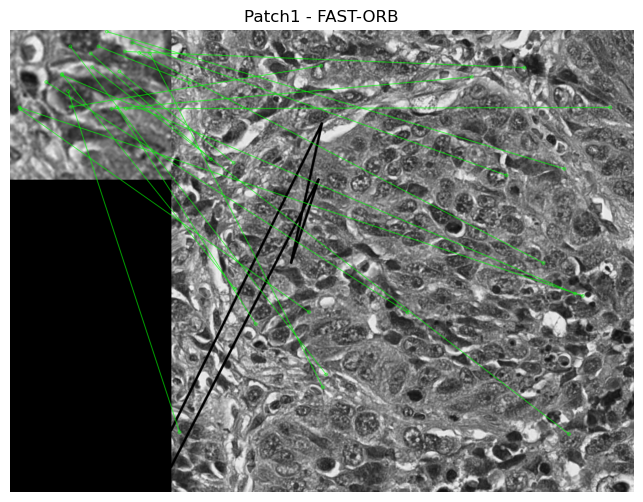

In [ ]:
new_img1 = compute_homography(deepcopy(img), img_kp, patch1, patch1_kp, matches1)
result1 = cv2.drawMatches(patch1, patch1_kp, new_img1, img_kp, matches1[:20], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=(0, 255, 0))

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.imshow(result1)
ax.axis('off')
ax.set_title('Patch1 - FAST-ORB')

Text(0.5, 1.0, 'Patch2 - FAST-ORB')

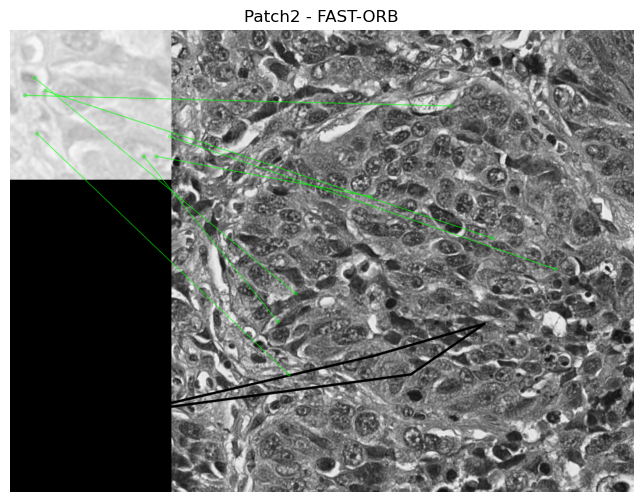

In [ ]:
new_img2 = compute_homography(deepcopy(img), img_kp, patch2, patch2_kp, matches2)
result2 = cv2.drawMatches(patch2, patch2_kp, new_img2, img_kp, matches2[:20], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=(0, 255, 0))

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.imshow(result2)
ax.axis('off')
ax.set_title('Patch2 - FAST-ORB')

Text(0.5, 1.0, 'Patch3 - FAST-ORB')

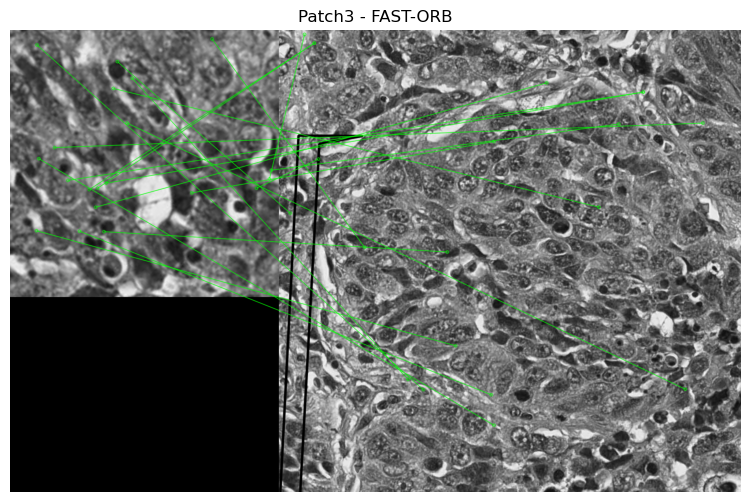

In [ ]:
new_img3 = compute_homography(deepcopy(img), img_kp, patch3, patch3_kp, matches3)
result3 = cv2.drawMatches(patch3, patch3_kp, new_img3, img_kp, matches3[:20], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=(0, 255, 0))

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.imshow(result3)
ax.axis('off')
ax.set_title('Patch3 - FAST-ORB')

### Harris feature detector

find corners

In [704]:
img_corners = cv2.cornerHarris(img, 2, 3, 0.04)
patch1_corners = cv2.cornerHarris(patch1, 2, 3, 0.04)
patch2_corners = cv2.cornerHarris(patch2, 2, 3, 0.04)
patch3_corners = cv2.cornerHarris(patch3, 2, 3, 0.04)

create a threshold value which will be used to choose only suitable corners or points

In [705]:
threshold = 0.01 * img_corners.max()
threshold_patch1 = 0.01 * patch1_corners.max()
threshold_patch2 = 0.01 * patch2_corners.max()
threshold_patch3 = 0.01 * patch3_corners.max()

create key points from extracted corners

In [706]:
img_kp = []
patch1_kp = []
patch2_kp = []
patch3_kp = []

for i in range(img_corners.shape[0]):
    for j in range(img_corners.shape[1]):
        if img_corners[i, j] > threshold:
            img_kp.append(cv2.KeyPoint(j, i, 1))

for i in range(patch1_corners.shape[0]):
    for j in range(patch1_corners.shape[1]):
        if patch1_corners[i, j] > threshold_patch1:
            patch1_kp.append(cv2.KeyPoint(j, i, 1))

for i in range(patch2_corners.shape[0]):
    for j in range(patch2_corners.shape[1]):
        if patch2_corners[i, j] > threshold_patch2:
            patch2_kp.append(cv2.KeyPoint(j, i, 1))

for i in range(patch3_corners.shape[0]):
    for j in range(patch3_corners.shape[1]):
        if patch3_corners[i, j] > threshold_patch3:
            patch3_kp.append(cv2.KeyPoint(j, i, 1))

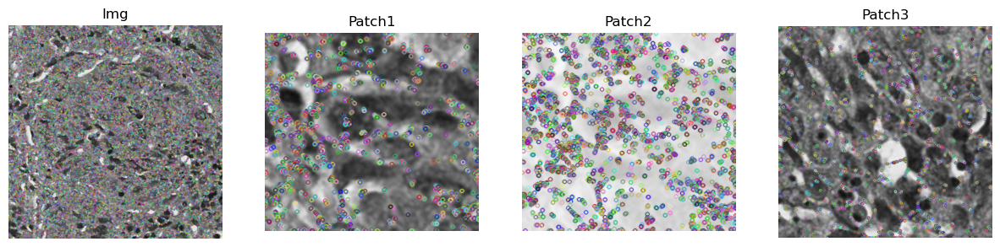

In [707]:
img_with_keypoints = cv2.drawKeypoints(img, img_kp, None)
patch1_with_keypoints = cv2.drawKeypoints(patch1, patch1_kp, None)
patch2_with_keypoints = cv2.drawKeypoints(patch2, patch2_kp, None)
patch3_with_keypoints = cv2.drawKeypoints(patch3, patch3_kp, None)

fig, axs = plt.subplots(1, 4, figsize=(15, 10))
for i, (p, t) in enumerate(zip((img_with_keypoints, patch1_with_keypoints, patch2_with_keypoints, patch3_with_keypoints), ('Img', 'Patch1', 'Patch2', 'Patch3'))):
    axs[i].imshow(p)
    axs[i].axis('off')
    axs[i].set_title(t)

#### SIFT feature descriptor

compute feature descriptors

In [708]:
img_descriptor = sift.compute(img, img_kp)[1]
patch1_descriptor = sift.compute(patch1, patch1_kp)[1]
patch2_descriptor = sift.compute(patch2, patch2_kp)[1]
patch3_descriptor = sift.compute(patch3, patch3_kp)[1]

Compute and draw matches between the original image and patch

In [709]:
matches1 = compute_matches(img_descriptor, patch1_descriptor)
matches2 = compute_matches(img_descriptor, patch2_descriptor)
matches3 = compute_matches(img_descriptor, patch3_descriptor)

Text(0.5, 1.0, 'Patch1 - Harris-SIFT')

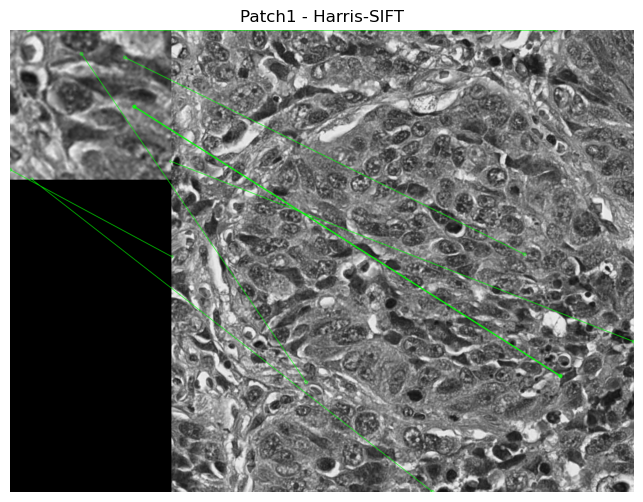

In [710]:
new_img1 = compute_homography(deepcopy(img), img_kp, patch1, patch1_kp, matches1)
result1 = cv2.drawMatches(patch1, patch1_kp, new_img1, img_kp, matches1[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=(0, 255, 0))

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.imshow(result1)
ax.axis('off')
ax.set_title('Patch1 - Harris-SIFT')

Text(0.5, 1.0, 'Patch2 - Harris-SIFT')

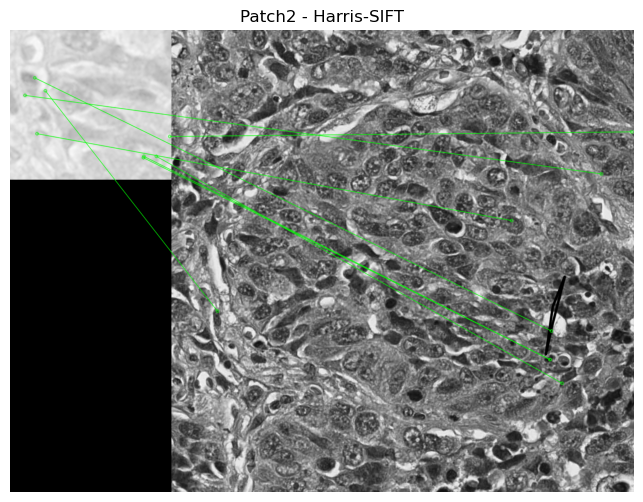

In [711]:
fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.imshow(result2)
ax.axis('off')
ax.set_title('Patch2 - Harris-SIFT')

Text(0.5, 1.0, 'Patch3 - Harris-SIFT')

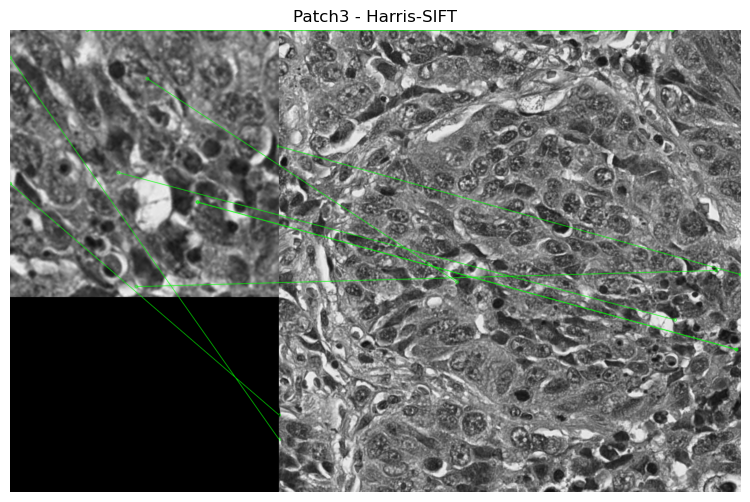

In [712]:
new_img3 = compute_homography(deepcopy(img), img_kp, patch3, patch3_kp, matches3)
result3 = cv2.drawMatches(patch3, patch3_kp, new_img3, img_kp, matches3[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=(0, 255, 0))

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.imshow(result3)
ax.axis('off')
ax.set_title('Patch3 - Harris-SIFT')

#### ORB feature descriptor

compute feature desctiptors

In [713]:
img_descriptor = orb.compute(img, img_kp)[1]
patch1_descriptor = orb.compute(patch1, patch1_kp)[1]
patch2_descriptor = orb.compute(patch2, patch2_kp)[1]
patch3_descriptor = orb.compute(patch3, patch3_kp)[1]

compute and draw matches between the original image and patch

In [714]:
matches1 = compute_matches(img_descriptor, patch1_descriptor)
matches2 = compute_matches(img_descriptor, patch2_descriptor)
matches3 = compute_matches(img_descriptor, patch3_descriptor)

Text(0.5, 1.0, 'Patch1 - Harris-ORB')

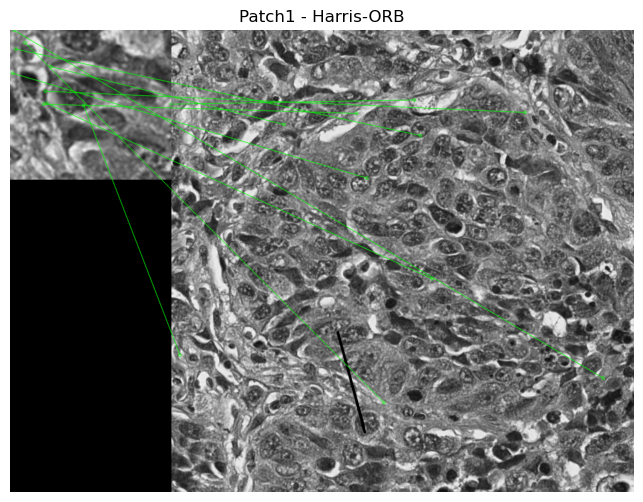

In [715]:
new_img1 = compute_homography(deepcopy(img), img_kp, patch1, patch1_kp, matches1)
result1 = cv2.drawMatches(patch1, patch1_kp, new_img1, img_kp, matches1[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=(0, 255, 0))

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.imshow(result1)
ax.axis('off')
ax.set_title('Patch1 - Harris-ORB')

Text(0.5, 1.0, 'Patch2 - Harris-ORB')

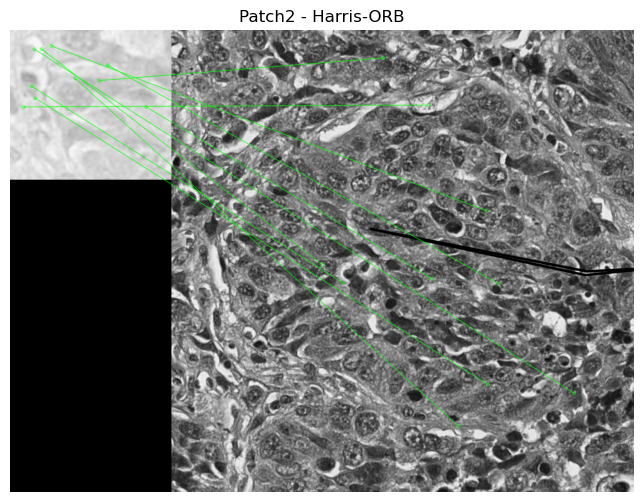

In [716]:
new_img2 = compute_homography(deepcopy(img), img_kp, patch2, patch2_kp, matches2)
result2 = cv2.drawMatches(patch2, patch2_kp, new_img2, img_kp, matches2[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=(0, 255, 0))

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.imshow(result2)
ax.axis('off')
ax.set_title('Patch2 - Harris-ORB')

Text(0.5, 1.0, 'Patch3 - Harris-ORB')

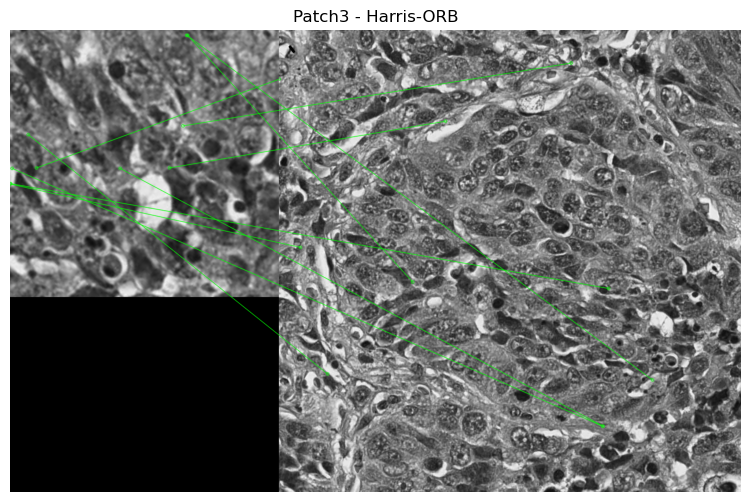

In [717]:
new_img3 = compute_homography(deepcopy(img), img_kp, patch3, patch3_kp, matches3)
result3 = cv2.drawMatches(patch3, patch3_kp, new_img3, img_kp, matches3[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS, matchColor=(0, 255, 0))

fig, ax = plt.subplots(1, 1, figsize=(10, 6))
ax.imshow(result3)
ax.axis('off')
ax.set_title('Patch3 - Harris-ORB')